In [152]:
import pandas as pdimport numpy as npimport matplotlib.pyplot as pltimport seaborn as snsfrom sklearn.model_selection import train_test_splitfrom sklearn.ensemble import RandomForestClassifierfrom sklearn.metrics import accuracy_score, confusion_matrix, classification_reportfrom sklearn.impute import SimpleImputerfrom sklearn.preprocessing import LabelEncoder, StandardScalerfrom sklearn.metrics import confusion_matrix

In [4]:
cr_data=pd.read_csv("C:/Users/BOT/Downloads/Crypto.csv")

In [6]:
cr_data

,Timestamp,Section A: Demographics\n\nAge Group,Gender,Education Level,Employment Status,Monthly Income Range,Section B: Awareness of Cryptocurrency\n\nHave you heard of cryptocurrency before?,"If yes, how would you rate your knowledge of cryptocurrency?",Where did you first hear about cryptocurrency?,Which cryptocurrencies are you familiar with? (Select all that apply),...,On which platforms or exchanges do you trade or manage your cryptocurrency?,Section D: Perceived Benefits and Barriers\n\nWhat are the main benefits you associate with cryptocurrency? (Select all that apply),What are the main concerns or barriers to using cryptocurrency? (Select all that apply),How likely are you to adopt cryptocurrency if these barriers were addressed?,Section E: Socioeconomic Impact and Future Perception\n\nDo you believe cryptocurrency could benefit Somalia’s economy?,What areas do you think cryptocurrency could impact the most in Somalia? (Select all that apply),"In your opinion, what is the potential role of cryptocurrency in promoting financial inclusion in Somalia?",What would make you more inclined to use or learn about cryptocurrency?\n,Section F: General Feedback and Additional Insights\n\nPlease share any additional comments on cryptocurrency adoption in Somalia or factors that could influence your decision to use it.,Email address
0,09/11/2024 16:17:41,18–24,Female,Postgraduate,Employed,$100–$500,Yes,Intermediate,Workplace,Bitcoin,...,Local Somali exchanges,Financial independence,Limited internet access or tech infrastructure,Very likely,Yes,"Small business transactions, Savings and inves...",Minimal role,Educational resources or training programs,Hh,NaN
1,09/11/2024 16:58:00,18–24,Male,Tertiary education (College/University),Employed,"$500–$1,000",Yes,Intermediate,Social Media,Bitcoin,...,Other (please specify),Financial independence,Lack of local support/acceptance,Very likely,Yes,"Remittances and money transfer, Small business...",Major role,Educational resources or training programs,Thank you,NaN
2,10/11/2024 08:10:25,18–24,Male,Tertiary education (College/University),Employed,$100–$500,Yes,Beginner,Social Media,Bitcoin,...,Other (please specify),Financial independence,"Regulatory uncertainty, Risk of fraud or scams",Not sure,Unsure,"Remittances and money transfer, Cross-border t...",No role,Availability of local support or services,i do not know because i did not use it at all.,NaN
3,10/11/2024 08:17:03,18–24,Male,Secondary education,Employed,"$500–$1,000",Yes,Intermediate,News and Media,Ethereum,...,Binance,"Lower transaction costs, Speed of transactions...","Regulatory uncertainty, Risk of fraud or scams...",Very likely,Yes,"Remittances and money transfer, Small business...",Moderate role,Educational resources or training programs,Waxaa jeclaa lahaaa in bankiyda Somali si toos...,NaN
4,10/11/2024 08:31:33,18–24,Male,Postgraduate,Employed,Less than $100,No,Beginner,Friends or Family,Bitcoin,...,Binance,Speed of transactions,Regulatory uncertainty,Very likely,No,Small business transactions,No role,Educational resources or training programs,Good,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,28/12/2024 22:04:58,18–24,Male,Secondary education,Self-employed,$100–$500,Yes,Beginner,Social Media,Bitcoin,...,Binance,Financial independence,Regulatory uncertainty,Very likely,Yes,Savings and investments,Moderate role,Educational resources or training programs,NaN,salmanyussuf59@gmail.com
207,28/12/2024 22:06:48,18–24,Male,Primary education,Employed,Less than $100,Yes,Beginner,Social Media,Bitcoin,...,Binance,Financial independence,Difficulty in understanding usage,Very likely,Yes,Small business transactions,Moderate role,Clearer government policies/regulations,NaN,libaanmaxamed27@gmail.com
208,28/12/2024 22:53:08,25–34,Male,Tertiary education (College/University),Employed,"Above $1,000",Yes,Intermediate,Friends or Family,"Bitcoin, Ethereum, Binance Coin",...,NaN,"Lower transaction cost

In [8]:
cr_data.head()

,Timestamp,Section A: Demographics\n\nAge Group,Gender,Education Level,Employment Status,Monthly Income Range,Section B: Awareness of Cryptocurrency\n\nHave you heard of cryptocurrency before?,"If yes, how would you rate your knowledge of cryptocurrency?",Where did you first hear about cryptocurrency?,Which cryptocurrencies are you familiar with? (Select all that apply),...,On which platforms or exchanges do you trade or manage your cryptocurrency?,Section D: Perceived Benefits and Barriers\n\nWhat are the main benefits you associate with cryptocurrency? (Select all that apply),What are the main concerns or barriers to using cryptocurrency? (Select all that apply),How likely are you to adopt cryptocurrency if these barriers were addressed?,Section E: Socioeconomic Impact and Future Perception\n\nDo you believe cryptocurrency could benefit Somalia’s economy?,What areas do you think cryptocurrency could impact the most in Somalia? (Select all that apply),"In your opinion, what is the potential role of cryptocurrency in promoting financial inclusion in Somalia?",What would make you more inclined to use or learn about cryptocurrency?\n,Section F: General Feedback and Additional Insights\n\nPlease share any additional comments on cryptocurrency adoption in Somalia or factors that could influence your decision to use it.,Email address
0,09/11/2024 16:17:41,18–24,Female,Postgraduate,Employed,$100–$500,Yes,Intermediate,Workplace,Bitcoin,...,Local Somali exchanges,Financial independence,Limited internet access or tech infrastructure,Very likely,Yes,"Small business transactions, Savings and inves...",Minimal role,Educational resources or training programs,Hh,NaN
1,09/11/2024 16:58:00,18–24,Male,Tertiary education (College/University),Employed,"$500–$1,000",Yes,Intermediate,Social Media,Bitcoin,...,Other (please specify),Financial independence,Lack of local support/acceptance,Very likely,Yes,"Remittances and money transfer, Small business...",Major role,Educational resources or training programs,Thank you,NaN
2,10/11/2024 08:10:25,18–24,Male,Tertiary education (College/University),Employed,$100–$500,Yes,Beginner,Social Media,Bitcoin,...,Other (please specify),Financial independence,"Regulatory uncertainty, Risk of fraud or scams",Not sure,Unsure,"Remittances and money transfer, Cross-border t...",No role,Availability of local support or services,i do not know because i did not use it at all.,NaN
3,10/11/2024 08:17:03,18–24,Male,Secondary education,Employed,"$500–$1,000",Yes,Intermediate,News and Media,Ethereum,...,Binance,"Lower transaction costs, Speed of transactions...","Regulatory uncertainty, Risk of fraud or scams...",Very likely,Yes,"Remittances and money transfer, Small business...",Moderate role,Educational resources or training programs,Waxaa jeclaa lahaaa in bankiyda Somali si toos...,NaN
4,10/11/2024 08:31:33,18–24,Male,Postgraduate,Employed,Less than $100,No,Beginner,Friends or Family,Bitcoin,...,Binance,Speed of transactions,Regulatory uncertainty,Very likely,No,Small business transactions,No role,Educational resources or training programs,Good,NaN


In [10]:
print(cr_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211 entries, 0 to 210
Data columns (total 23 columns):
 #   Column                                                                                                                                                                                    Non-Null Count  Dtype 
---  ------                                                                                                                                                                                    --------------  ----- 
 0   Timestamp                                                                                                                                                                                 211 non-null    object
 1   Section A: Demographics

Age Group                                                                                                                                                        211 non-null    object
 2   Gender                            

In [12]:
print(cr_data.isnull().sum())

Timestamp                                                                                                                                                                                       0
Section A: Demographics\n\nAge Group                                                                                                                                                            0
Gender                                                                                                                                                                                          0
Education Level                                                                                                                                                                                 0
Employment Status                                                                                                                                                                               0
Monthly Income Range          

In [18]:
cr_dataX = cr_data.drop(['Email address', 'Timestamp'], axis=1)

In [20]:
cr_dataX

,Section A: Demographics\n\nAge Group,Gender,Education Level,Employment Status,Monthly Income Range,Section B: Awareness of Cryptocurrency\n\nHave you heard of cryptocurrency before?,"If yes, how would you rate your knowledge of cryptocurrency?",Where did you first hear about cryptocurrency?,Which cryptocurrencies are you familiar with? (Select all that apply),Section C: Adoption and Usage Patterns\n\nHave you ever used cryptocurrency?,...,What purposes do you use cryptocurrency for? (Select all that apply)\n,On which platforms or exchanges do you trade or manage your cryptocurrency?,Section D: Perceived Benefits and Barriers\n\nWhat are the main benefits you associate with cryptocurrency? (Select all that apply),What are the main concerns or barriers to using cryptocurrency? (Select all that apply),How likely are you to adopt cryptocurrency if these barriers were addressed?,Section E: Socioeconomic Impact and Future Perception\n\nDo you believe cryptocurrency could benefit Somalia’s economy?,What areas do you think cryptocurrency could impact the most in Somalia? (Select all that apply),"In your opinion, what is the potential role of cryptocurrency in promoting financial inclusion in Somalia?",What would make you more inclined to use or learn about cryptocurrency?\n,Section F: General Feedback and Additional Insights\n\nPlease share any additional comments on cryptocurrency adoption in Somalia or factors that could influence your decision to use it.
0,18–24,Female,Postgraduate,Employed,$100–$500,Yes,Intermediate,Workplace,Bitcoin,No,...,Investment,Local Somali exchanges,Financial independence,Limited internet access or tech infrastructure,Very likely,Yes,"Small business transactions, Savings and inves...",Minimal role,Educational resources or training programs,Hh
1,18–24,Male,Tertiary education (College/University),Employed,"$500–$1,000",Yes,Intermediate,Social Media,Bitcoin,Yes,...,Investment,Other (please specify),Financial independence,Lack of local support/acceptance,Very likely,Yes,"Remittances and money transfer, Small business...",Major role,Educational resources or training programs,Thank you
2,18–24,Male,Tertiary education (College/University),Employed,$100–$500,Yes,Beginner,Social Media,Bitcoin,No,...,Investment,Other (please specify),Financial independence,"Regulatory uncertainty, Risk of fraud or scams",Not sure,Unsure,"Remittances and money transfer, Cross-border t...",No role,Availability of local support or services,i do not know because i did not use it at all.
3,18–24,Male,Secondary education,Employed,"$500–$1,000",Yes,Intermediate,News and Media,Ethereum,Yes,...,Investment,Binance,"Lower transaction costs, Speed of transactions...","Regulatory uncertainty, Risk of fraud or scams...",Very likely,Yes,"Remittances and money transfer, Small business...",Moderate role,Educational resources or training programs,Waxaa jeclaa lahaaa in bankiyda Somali si toos...
4,18–24,Male,Postgraduate,Employed,Less than $100,No,Beginner,Friends or Family,Bitcoin,No,...,Savings,Binance,Speed of transactions,Regulatory uncertainty,Very likely,No,Small business transactions,No role,Educational resources or training programs,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,18–24,Male,Secondary education,Self-employed,$100–$500,Yes,Beginner,Social Media,Bitcoin,Yes,...,Investment,Binance,Financial independence,Regulatory uncertainty,Very likely,Yes,Savings and investments,Moderate role,Educational resources or training programs,NaN
207,18–24,Male,Primary education,Employed,Less than $100,Yes,Beginner,Social Media,Bitcoin,Yes,...,Purchases/Payments,Binance,Financial independence,Difficulty in understanding usage,Very likely,Yes,Small business transactions,Moderate role,Clearer government policies/regulations,NaN
208,25–34,Male,Tertiary education (College/University),Employed,"Above $1,000",Yes,Intermediate,Friends or Family,"Bitcoin, Ethereum, Binance Coin",No,...,Never used,NaN,"Lower tr

# Data Cleaning and Preprocessing

In [28]:
threshold = 0.5 * len(cr_dataX)

In [30]:
crypto_data = cr_dataX.dropna(thresh=threshold, axis=1)print("\nColumns with excessive missing values have been dropped.")


Columns with excessive missing values have been dropped.


In [32]:
crypto_data

,Section A: Demographics\n\nAge Group,Gender,Education Level,Employment Status,Monthly Income Range,Section B: Awareness of Cryptocurrency\n\nHave you heard of cryptocurrency before?,"If yes, how would you rate your knowledge of cryptocurrency?",Where did you first hear about cryptocurrency?,Which cryptocurrencies are you familiar with? (Select all that apply),Section C: Adoption and Usage Patterns\n\nHave you ever used cryptocurrency?,"If yes, how often do you use cryptocurrency?",What purposes do you use cryptocurrency for? (Select all that apply)\n,On which platforms or exchanges do you trade or manage your cryptocurrency?,Section D: Perceived Benefits and Barriers\n\nWhat are the main benefits you associate with cryptocurrency? (Select all that apply),What are the main concerns or barriers to using cryptocurrency? (Select all that apply),How likely are you to adopt cryptocurrency if these barriers were addressed?,Section E: Socioeconomic Impact and Future Perception\n\nDo you believe cryptocurrency could benefit Somalia’s economy?,What areas do you think cryptocurrency could impact the most in Somalia? (Select all that apply),"In your opinion, what is the potential role of cryptocurrency in promoting financial inclusion in Somalia?",What would make you more inclined to use or learn about cryptocurrency?\n
0,18–24,Female,Postgraduate,Employed,$100–$500,Yes,Intermediate,Workplace,Bitcoin,No,Weekly,Investment,Local Somali exchanges,Financial independence,Limited internet access or tech infrastructure,Very likely,Yes,"Small business transactions, Savings and inves...",Minimal role,Educational resources or training programs
1,18–24,Male,Tertiary education (College/University),Employed,"$500–$1,000",Yes,Intermediate,Social Media,Bitcoin,Yes,Monthly,Investment,Other (please specify),Financial independence,Lack of local support/acceptance,Very likely,Yes,"Remittances and money transfer, Small business...",Major role,Educational resources or training programs
2,18–24,Male,Tertiary education (College/University),Employed,$100–$500,Yes,Beginner,Social Media,Bitcoin,No,Rarely,Investment,Other (please specify),Financial independence,"Regulatory uncertainty, Risk of fraud or scams",Not sure,Unsure,"Remittances and money transfer, Cross-border t...",No role,Availability of local support or services
3,18–24,Male,Secondary education,Employed,"$500–$1,000",Yes,Intermediate,News and Media,Ethereum,Yes,Daily,Investment,Binance,"Lower transaction costs, Speed of transactions...","Regulatory uncertainty, Risk of fraud or scams...",Very likely,Yes,"Remittances and money transfer, Small business...",Moderate role,Educational resources or training programs
4,18–24,Male,Postgraduate,Employed,Less than $100,No,Beginner,Friends or Family,Bitcoin,No,Daily,Savings,Binance,Speed of transactions,Regulatory uncertainty,Very likely,No,Small business transactions,No role,Educational resources or training programs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,18–24,Male,Secondary education,Self-employed,$100–$500,Yes,Beginner,Social Media,Bitcoin,Yes,Daily,Investment,Binance,Financial independence,Regulatory uncertainty,Very likely,Yes,Savings and investments,Moderate role,Educational resources or training programs
207,18–24,Male,Primary education,Employed,Less than $100,Yes,Beginner,Social Media,Bitcoin,Yes,Weekly,Purchases/Payments,Binance,Financial independence,Difficulty in understanding usage,Very likely,Yes,Small business transactions,Moderate role,Clearer government policies/regulations
208,25–34,Male,Tertiary education (College/University),Employed,"Above $1,000",Yes,Intermediate,Friends or Family,"Bitcoin, Ethereum, Binance Coin",No,Rarely,Never used,NaN,"Lower transaction costs, Speed of transactions...","Regulatory uncertainty, Risk of fraud or scams...",Very likely,Yes,"Remittances and money transfer, Savings and in...",Major role,Clearer government policies/regulations
209,18–24,Male,Tertiary education (

In [34]:
imputer = SimpleImputer(strategy="most_frequent")crypto_data_cleaned = pd.DataFrame(imputer.fit_transform(crypto_data), columns=crypto_data.columns)print("\nMissing values have been handled using the most frequent values.")


Missing values have been handled using the most frequent values.


In [36]:
crypto_data_cleaned

,Section A: Demographics\n\nAge Group,Gender,Education Level,Employment Status,Monthly Income Range,Section B: Awareness of Cryptocurrency\n\nHave you heard of cryptocurrency before?,"If yes, how would you rate your knowledge of cryptocurrency?",Where did you first hear about cryptocurrency?,Which cryptocurrencies are you familiar with? (Select all that apply),Section C: Adoption and Usage Patterns\n\nHave you ever used cryptocurrency?,"If yes, how often do you use cryptocurrency?",What purposes do you use cryptocurrency for? (Select all that apply)\n,On which platforms or exchanges do you trade or manage your cryptocurrency?,Section D: Perceived Benefits and Barriers\n\nWhat are the main benefits you associate with cryptocurrency? (Select all that apply),What are the main concerns or barriers to using cryptocurrency? (Select all that apply),How likely are you to adopt cryptocurrency if these barriers were addressed?,Section E: Socioeconomic Impact and Future Perception\n\nDo you believe cryptocurrency could benefit Somalia’s economy?,What areas do you think cryptocurrency could impact the most in Somalia? (Select all that apply),"In your opinion, what is the potential role of cryptocurrency in promoting financial inclusion in Somalia?",What would make you more inclined to use or learn about cryptocurrency?\n
0,18–24,Female,Postgraduate,Employed,$100–$500,Yes,Intermediate,Workplace,Bitcoin,No,Weekly,Investment,Local Somali exchanges,Financial independence,Limited internet access or tech infrastructure,Very likely,Yes,"Small business transactions, Savings and inves...",Minimal role,Educational resources or training programs
1,18–24,Male,Tertiary education (College/University),Employed,"$500–$1,000",Yes,Intermediate,Social Media,Bitcoin,Yes,Monthly,Investment,Other (please specify),Financial independence,Lack of local support/acceptance,Very likely,Yes,"Remittances and money transfer, Small business...",Major role,Educational resources or training programs
2,18–24,Male,Tertiary education (College/University),Employed,$100–$500,Yes,Beginner,Social Media,Bitcoin,No,Rarely,Investment,Other (please specify),Financial independence,"Regulatory uncertainty, Risk of fraud or scams",Not sure,Unsure,"Remittances and money transfer, Cross-border t...",No role,Availability of local support or services
3,18–24,Male,Secondary education,Employed,"$500–$1,000",Yes,Intermediate,News and Media,Ethereum,Yes,Daily,Investment,Binance,"Lower transaction costs, Speed of transactions...","Regulatory uncertainty, Risk of fraud or scams...",Very likely,Yes,"Remittances and money transfer, Small business...",Moderate role,Educational resources or training programs
4,18–24,Male,Postgraduate,Employed,Less than $100,No,Beginner,Friends or Family,Bitcoin,No,Daily,Savings,Binance,Speed of transactions,Regulatory uncertainty,Very likely,No,Small business transactions,No role,Educational resources or training programs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,18–24,Male,Secondary education,Self-employed,$100–$500,Yes,Beginner,Social Media,Bitcoin,Yes,Daily,Investment,Binance,Financial independence,Regulatory uncertainty,Very likely,Yes,Savings and investments,Moderate role,Educational resources or training programs
207,18–24,Male,Primary education,Employed,Less than $100,Yes,Beginner,Social Media,Bitcoin,Yes,Weekly,Purchases/Payments,Binance,Financial independence,Difficulty in understanding usage,Very likely,Yes,Small business transactions,Moderate role,Clearer government policies/regulations
208,25–34,Male,Tertiary education (College/University),Employed,"Above $1,000",Yes,Intermediate,Friends or Family,"Bitcoin, Ethereum, Binance Coin",No,Rarely,Never used,Binance,"Lower transaction costs, Speed of transactions...","Regulatory uncertainty, Risk of fraud or scams...",Very likely,Yes,"Remittances and money transfer, Savings and in...",Major role,Clearer government policies/regulations
209,18–24,Male,Tertiary educati

In [38]:
for col in crypto_data_cleaned.select_dtypes(include=['object']).columns:    crypto_data_cleaned[col] = crypto_data_cleaned[col].str.lower()

In [40]:
crypto_data_cleaned

,Section A: Demographics\n\nAge Group,Gender,Education Level,Employment Status,Monthly Income Range,Section B: Awareness of Cryptocurrency\n\nHave you heard of cryptocurrency before?,"If yes, how would you rate your knowledge of cryptocurrency?",Where did you first hear about cryptocurrency?,Which cryptocurrencies are you familiar with? (Select all that apply),Section C: Adoption and Usage Patterns\n\nHave you ever used cryptocurrency?,"If yes, how often do you use cryptocurrency?",What purposes do you use cryptocurrency for? (Select all that apply)\n,On which platforms or exchanges do you trade or manage your cryptocurrency?,Section D: Perceived Benefits and Barriers\n\nWhat are the main benefits you associate with cryptocurrency? (Select all that apply),What are the main concerns or barriers to using cryptocurrency? (Select all that apply),How likely are you to adopt cryptocurrency if these barriers were addressed?,Section E: Socioeconomic Impact and Future Perception\n\nDo you believe cryptocurrency could benefit Somalia’s economy?,What areas do you think cryptocurrency could impact the most in Somalia? (Select all that apply),"In your opinion, what is the potential role of cryptocurrency in promoting financial inclusion in Somalia?",What would make you more inclined to use or learn about cryptocurrency?\n
0,18–24,female,postgraduate,employed,$100–$500,yes,intermediate,workplace,bitcoin,no,weekly,investment,local somali exchanges,financial independence,limited internet access or tech infrastructure,very likely,yes,"small business transactions, savings and inves...",minimal role,educational resources or training programs
1,18–24,male,tertiary education (college/university),employed,"$500–$1,000",yes,intermediate,social media,bitcoin,yes,monthly,investment,other (please specify),financial independence,lack of local support/acceptance,very likely,yes,"remittances and money transfer, small business...",major role,educational resources or training programs
2,18–24,male,tertiary education (college/university),employed,$100–$500,yes,beginner,social media,bitcoin,no,rarely,investment,other (please specify),financial independence,"regulatory uncertainty, risk of fraud or scams",not sure,unsure,"remittances and money transfer, cross-border t...",no role,availability of local support or services
3,18–24,male,secondary education,employed,"$500–$1,000",yes,intermediate,news and media,ethereum,yes,daily,investment,binance,"lower transaction costs, speed of transactions...","regulatory uncertainty, risk of fraud or scams...",very likely,yes,"remittances and money transfer, small business...",moderate role,educational resources or training programs
4,18–24,male,postgraduate,employed,less than $100,no,beginner,friends or family,bitcoin,no,daily,savings,binance,speed of transactions,regulatory uncertainty,very likely,no,small business transactions,no role,educational resources or training programs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,18–24,male,secondary education,self-employed,$100–$500,yes,beginner,social media,bitcoin,yes,daily,investment,binance,financial independence,regulatory uncertainty,very likely,yes,savings and investments,moderate role,educational resources or training programs
207,18–24,male,primary education,employed,less than $100,yes,beginner,social media,bitcoin,yes,weekly,purchases/payments,binance,financial independence,difficulty in understanding usage,very likely,yes,small business transactions,moderate role,clearer government policies/regulations
208,25–34,male,tertiary education (college/university),employed,"above $1,000",yes,intermediate,friends or family,"bitcoin, ethereum, binance coin",no,rarely,never used,binance,"lower transaction costs, speed of transactions...","regulatory uncertainty, risk of fraud or scams...",very likely,yes,"remittances and money transfer, savings and in...",major role,clearer government policies/regulations
209,18–24,male,tertiary educati

In [42]:
crypto_data_cleaned = crypto_data_cleaned.drop_duplicates()print("\nDuplicates have been removed.")


Duplicates have been removed.


In [44]:
crypto_data_cleaned

,Section A: Demographics\n\nAge Group,Gender,Education Level,Employment Status,Monthly Income Range,Section B: Awareness of Cryptocurrency\n\nHave you heard of cryptocurrency before?,"If yes, how would you rate your knowledge of cryptocurrency?",Where did you first hear about cryptocurrency?,Which cryptocurrencies are you familiar with? (Select all that apply),Section C: Adoption and Usage Patterns\n\nHave you ever used cryptocurrency?,"If yes, how often do you use cryptocurrency?",What purposes do you use cryptocurrency for? (Select all that apply)\n,On which platforms or exchanges do you trade or manage your cryptocurrency?,Section D: Perceived Benefits and Barriers\n\nWhat are the main benefits you associate with cryptocurrency? (Select all that apply),What are the main concerns or barriers to using cryptocurrency? (Select all that apply),How likely are you to adopt cryptocurrency if these barriers were addressed?,Section E: Socioeconomic Impact and Future Perception\n\nDo you believe cryptocurrency could benefit Somalia’s economy?,What areas do you think cryptocurrency could impact the most in Somalia? (Select all that apply),"In your opinion, what is the potential role of cryptocurrency in promoting financial inclusion in Somalia?",What would make you more inclined to use or learn about cryptocurrency?\n
0,18–24,female,postgraduate,employed,$100–$500,yes,intermediate,workplace,bitcoin,no,weekly,investment,local somali exchanges,financial independence,limited internet access or tech infrastructure,very likely,yes,"small business transactions, savings and inves...",minimal role,educational resources or training programs
1,18–24,male,tertiary education (college/university),employed,"$500–$1,000",yes,intermediate,social media,bitcoin,yes,monthly,investment,other (please specify),financial independence,lack of local support/acceptance,very likely,yes,"remittances and money transfer, small business...",major role,educational resources or training programs
2,18–24,male,tertiary education (college/university),employed,$100–$500,yes,beginner,social media,bitcoin,no,rarely,investment,other (please specify),financial independence,"regulatory uncertainty, risk of fraud or scams",not sure,unsure,"remittances and money transfer, cross-border t...",no role,availability of local support or services
3,18–24,male,secondary education,employed,"$500–$1,000",yes,intermediate,news and media,ethereum,yes,daily,investment,binance,"lower transaction costs, speed of transactions...","regulatory uncertainty, risk of fraud or scams...",very likely,yes,"remittances and money transfer, small business...",moderate role,educational resources or training programs
4,18–24,male,postgraduate,employed,less than $100,no,beginner,friends or family,bitcoin,no,daily,savings,binance,speed of transactions,regulatory uncertainty,very likely,no,small business transactions,no role,educational resources or training programs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,18–24,male,secondary education,self-employed,$100–$500,yes,beginner,social media,bitcoin,yes,daily,investment,binance,financial independence,regulatory uncertainty,very likely,yes,savings and investments,moderate role,educational resources or training programs
207,18–24,male,primary education,employed,less than $100,yes,beginner,social media,bitcoin,yes,weekly,purchases/payments,binance,financial independence,difficulty in understanding usage,very likely,yes,small business transactions,moderate role,clearer government policies/regulations
208,25–34,male,tertiary education (college/university),employed,"above $1,000",yes,intermediate,friends or family,"bitcoin, ethereum, binance coin",no,rarely,never used,binance,"lower transaction costs, speed of transactions...","regulatory uncertainty, risk of fraud or scams...",very likely,yes,"remittances and money transfer, savings and in...",major role,clearer government policies/regulations
209,18–24,male,tertiary educati

In [46]:
print("\nCleaned Data Overview:")print(crypto_data_cleaned.info())


Cleaned Data Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211 entries, 0 to 210
Data columns (total 20 columns):
 #   Column                                                                                                                             Non-Null Count  Dtype 
---  ------                                                                                                                             --------------  ----- 
 0   Section A: Demographics

Age Group                                                                                                 211 non-null    object
 1   Gender                                                                                                                             211 non-null    object
 2   Education Level                                                                                                                    211 non-null    object
 3   Employment Status                                                      

# Exploratory Data Analysis (EDA)

In [50]:
print("\nDescriptive Statistics:")print(crypto_data_cleaned.describe(include='all'))


Descriptive Statistics:
       Section A: Demographics\n\nAge Group Gender  \
count                                   211    211   
unique                                    4      3   
top                                   18–24   male   
freq                                    134    180   

                                Education Level Employment Status  \
count                                       211               211   
unique                                        5                 8   
top     tertiary education (college/university)          employed   
freq                                        115                73   

       Monthly Income Range  \
count                   211   
unique                    4   
top               $100–$500   
freq                     93   

       Section B: Awareness of Cryptocurrency\n\nHave you heard of cryptocurrency before?  \
count                                                 211                                   
unique          

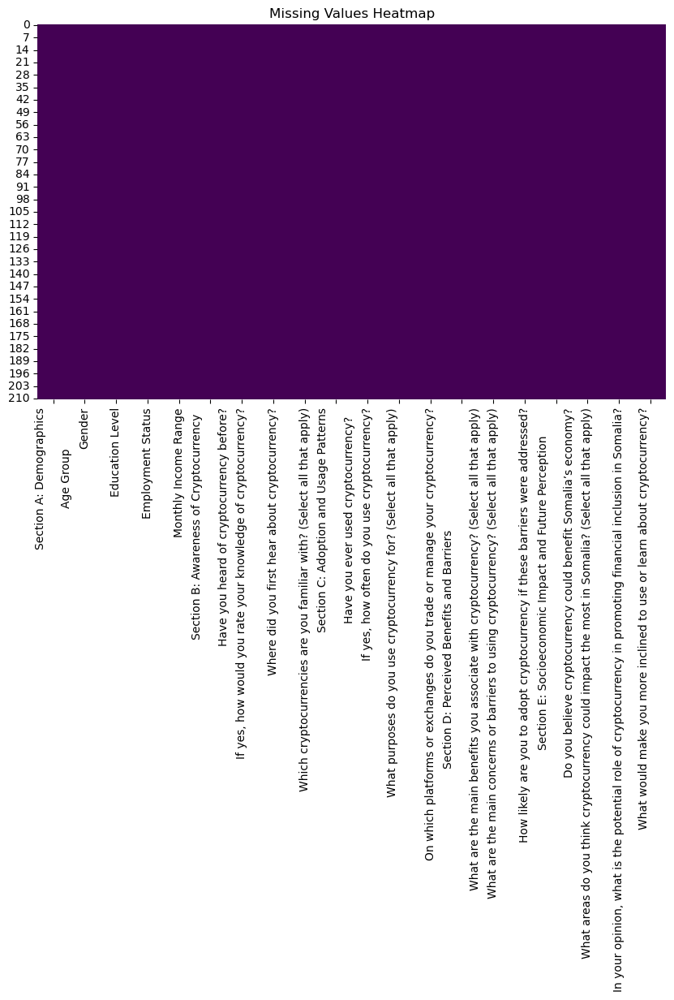

In [52]:
plt.figure(figsize=(10, 6))sns.heatmap(crypto_data_cleaned.isnull(), cbar=False, cmap="viridis")plt.title("Missing Values Heatmap")plt.show()

SyntaxError: incomplete input (3352689375.py, line 12)

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


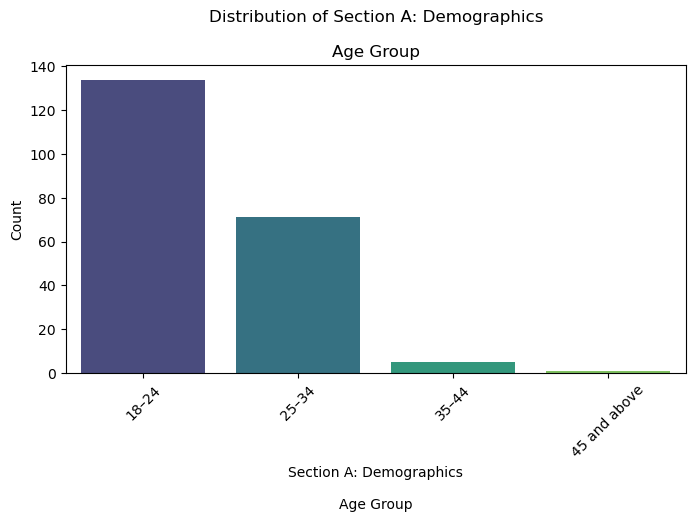

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


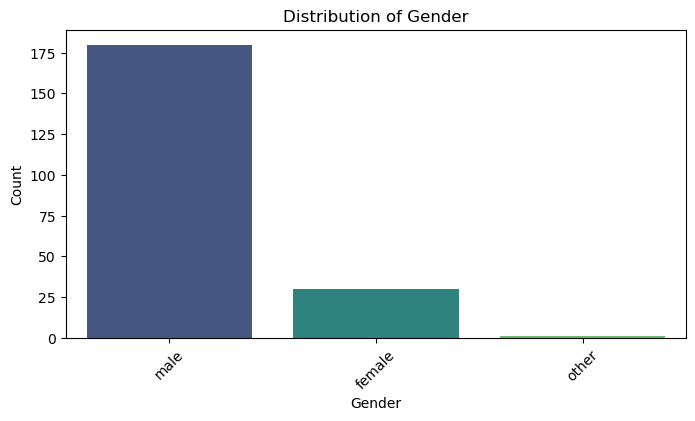

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


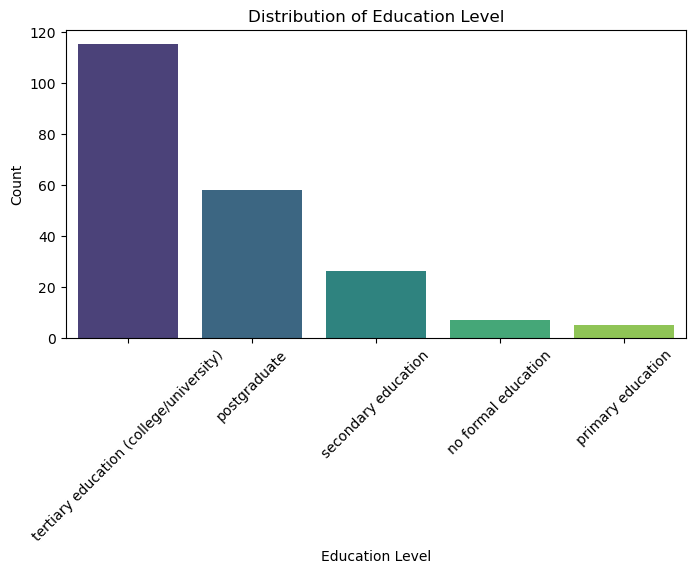

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


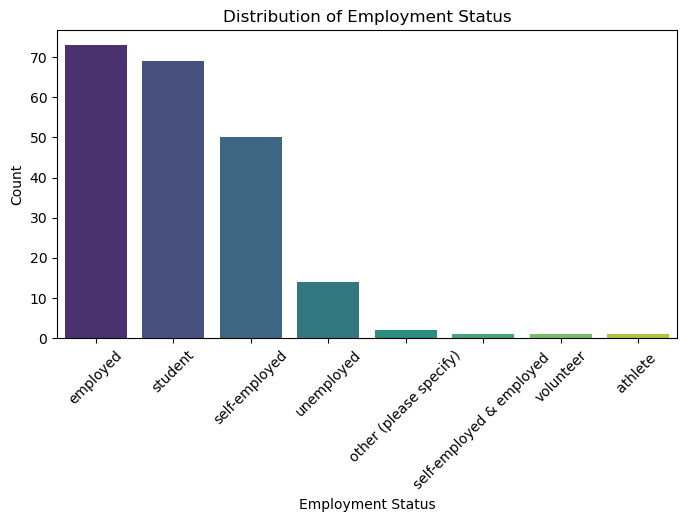

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


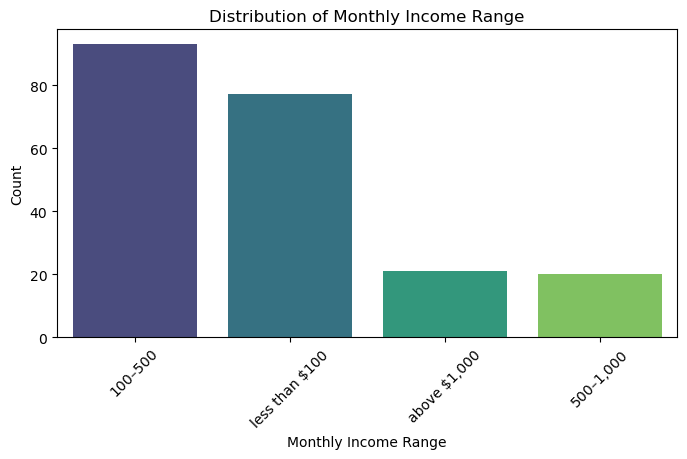

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


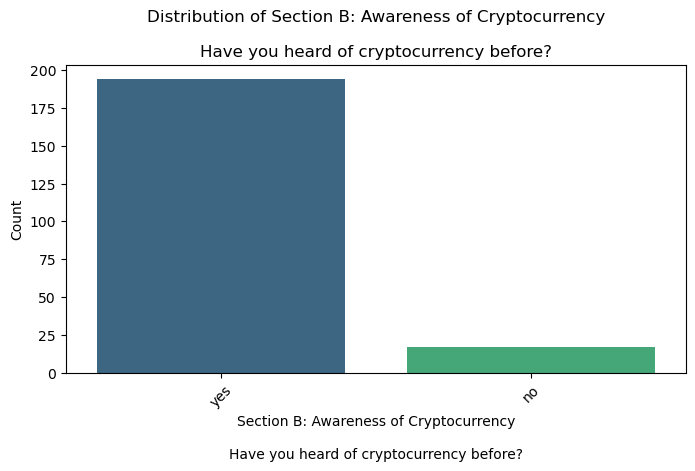

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


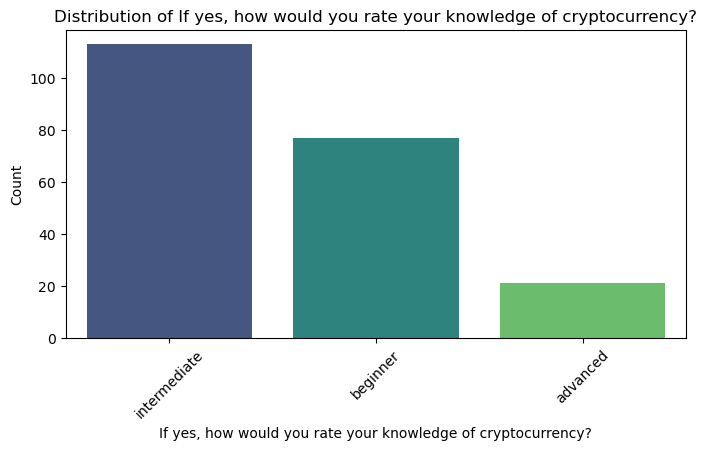

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


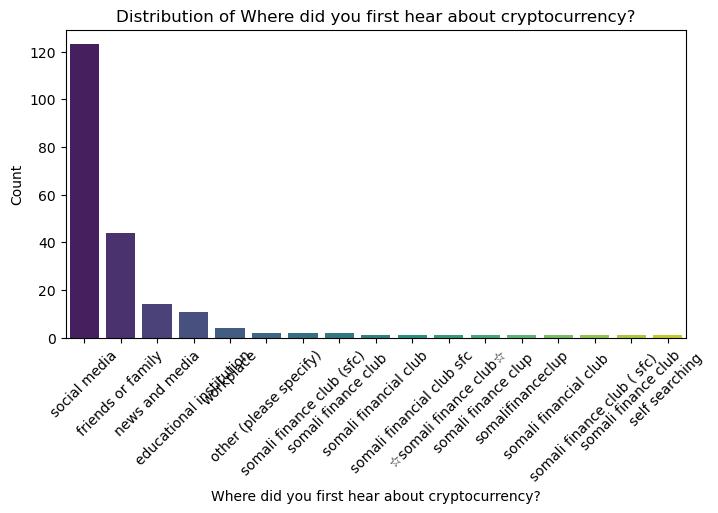

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


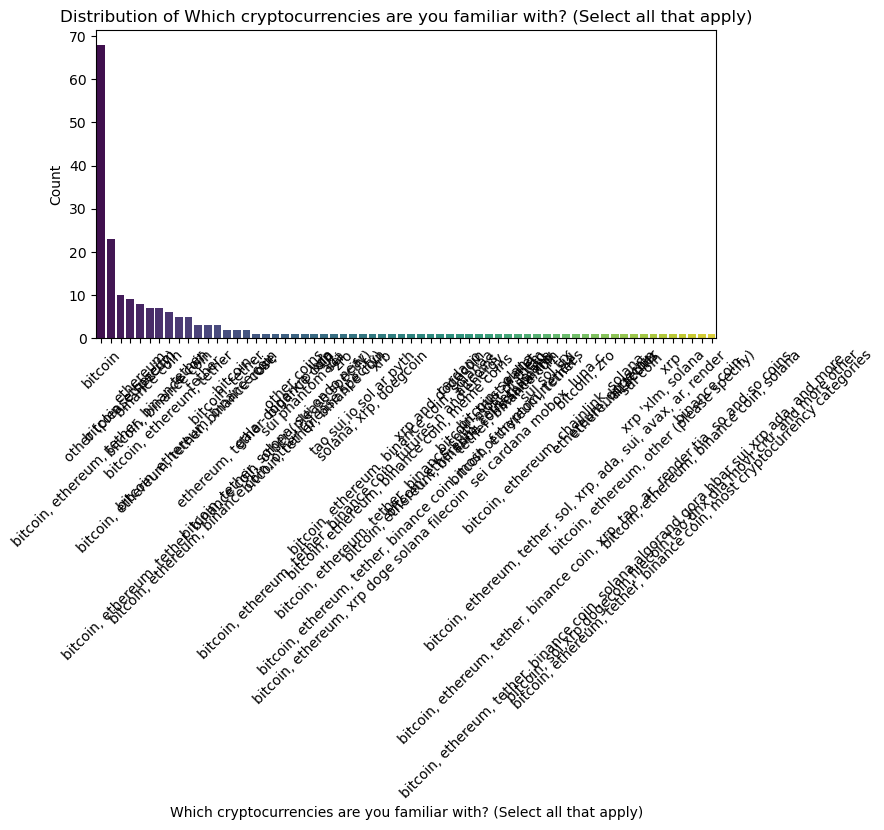

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


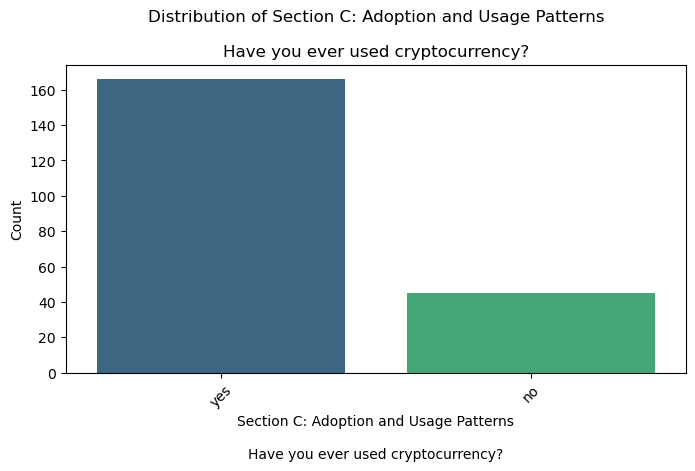

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


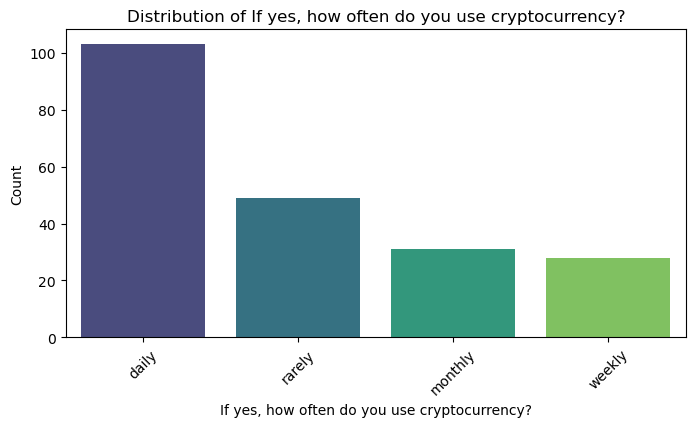

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


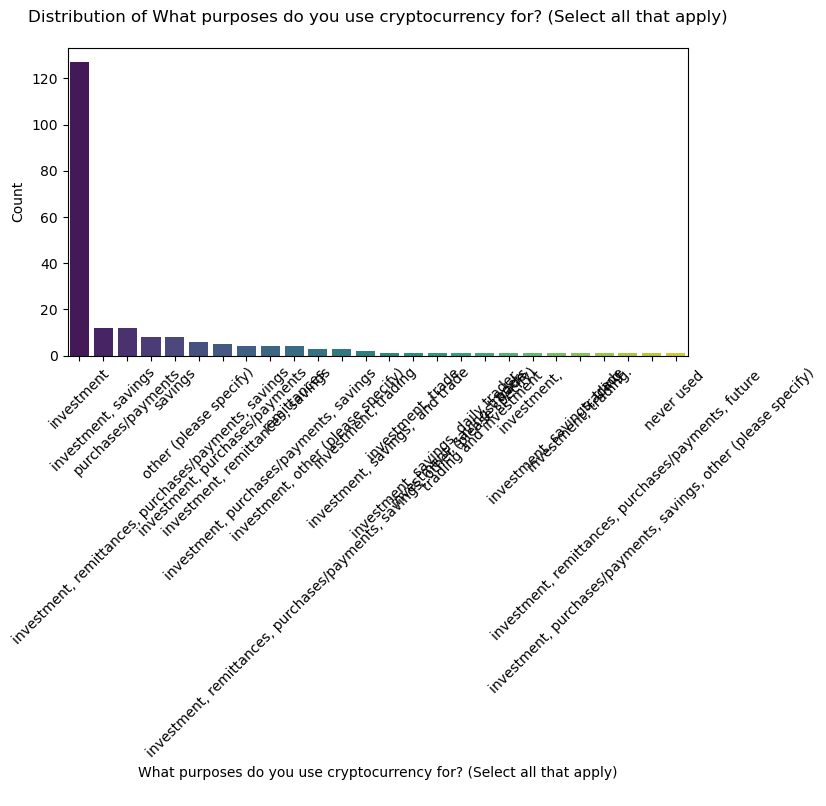

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


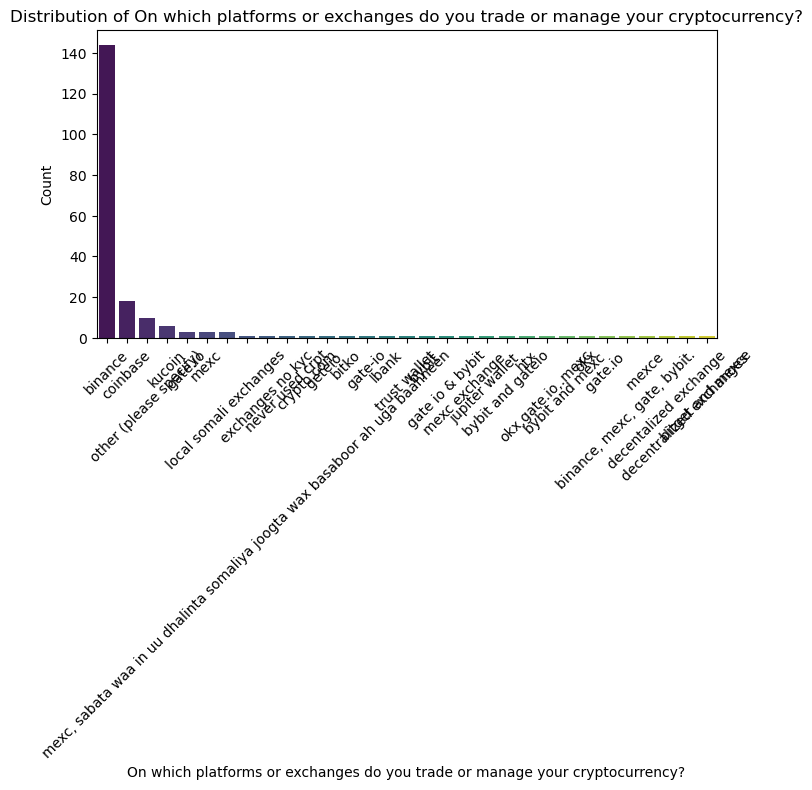

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


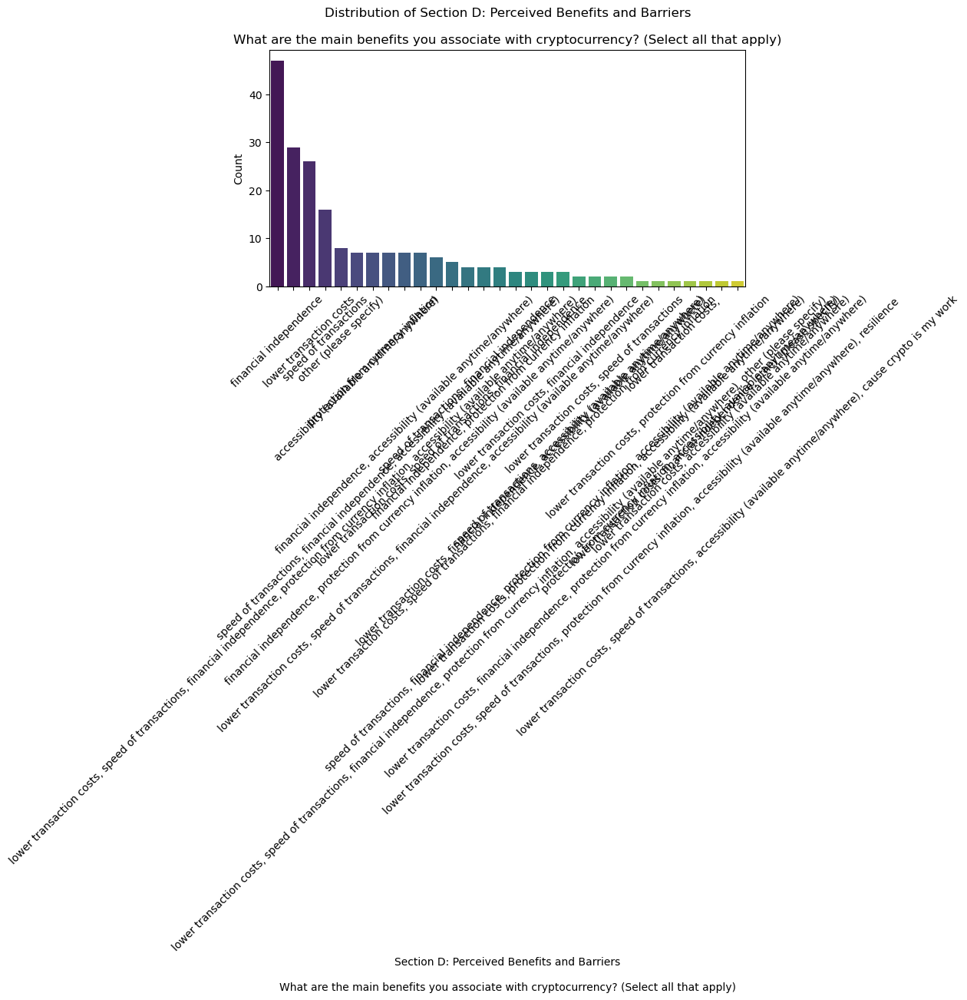

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


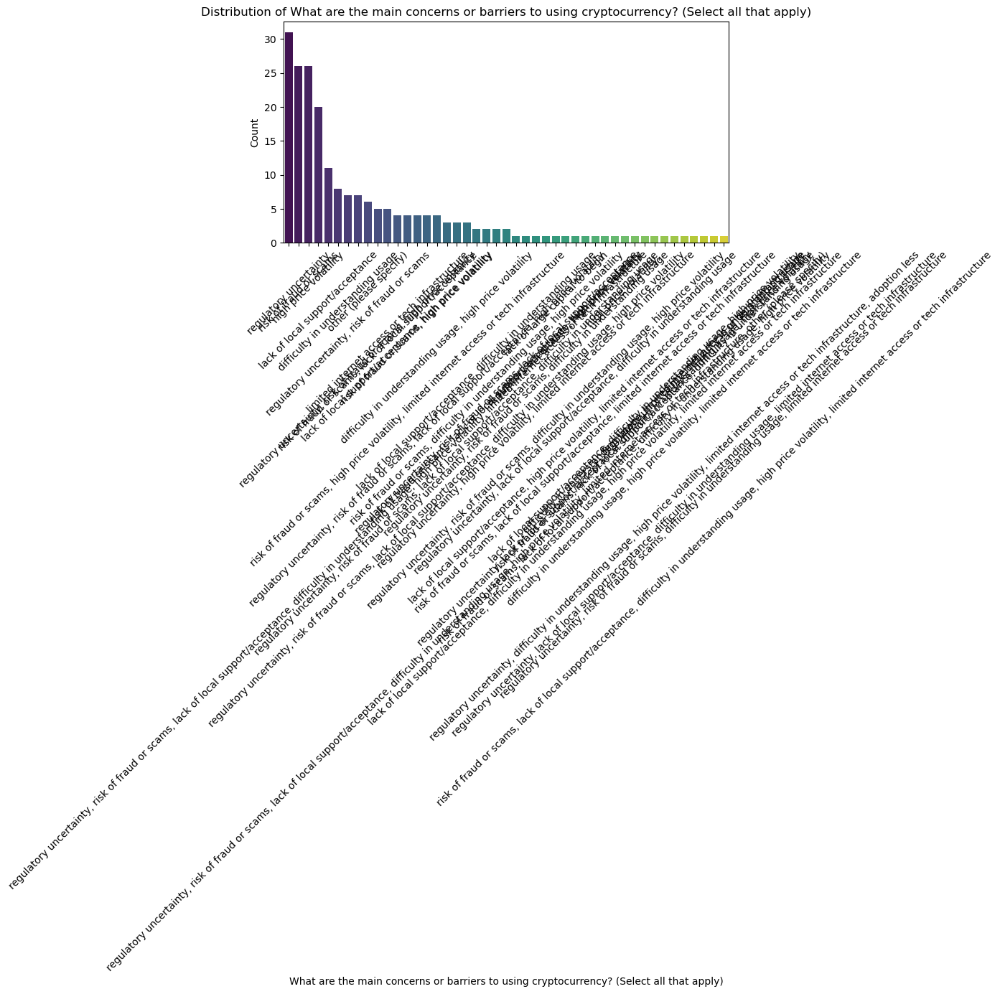

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


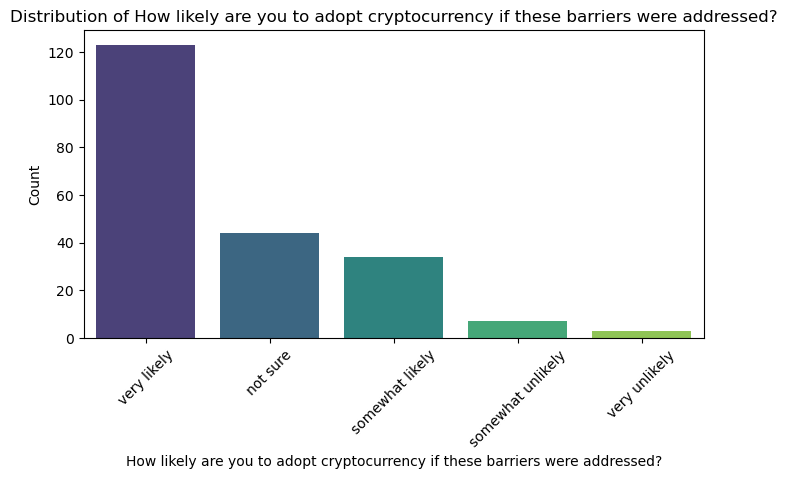

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


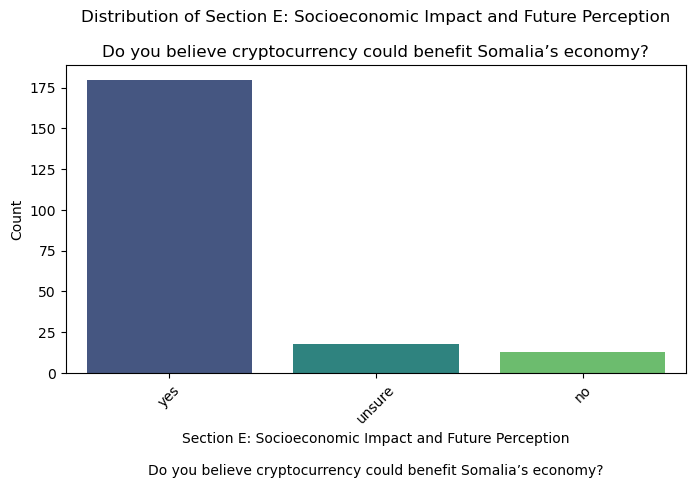

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


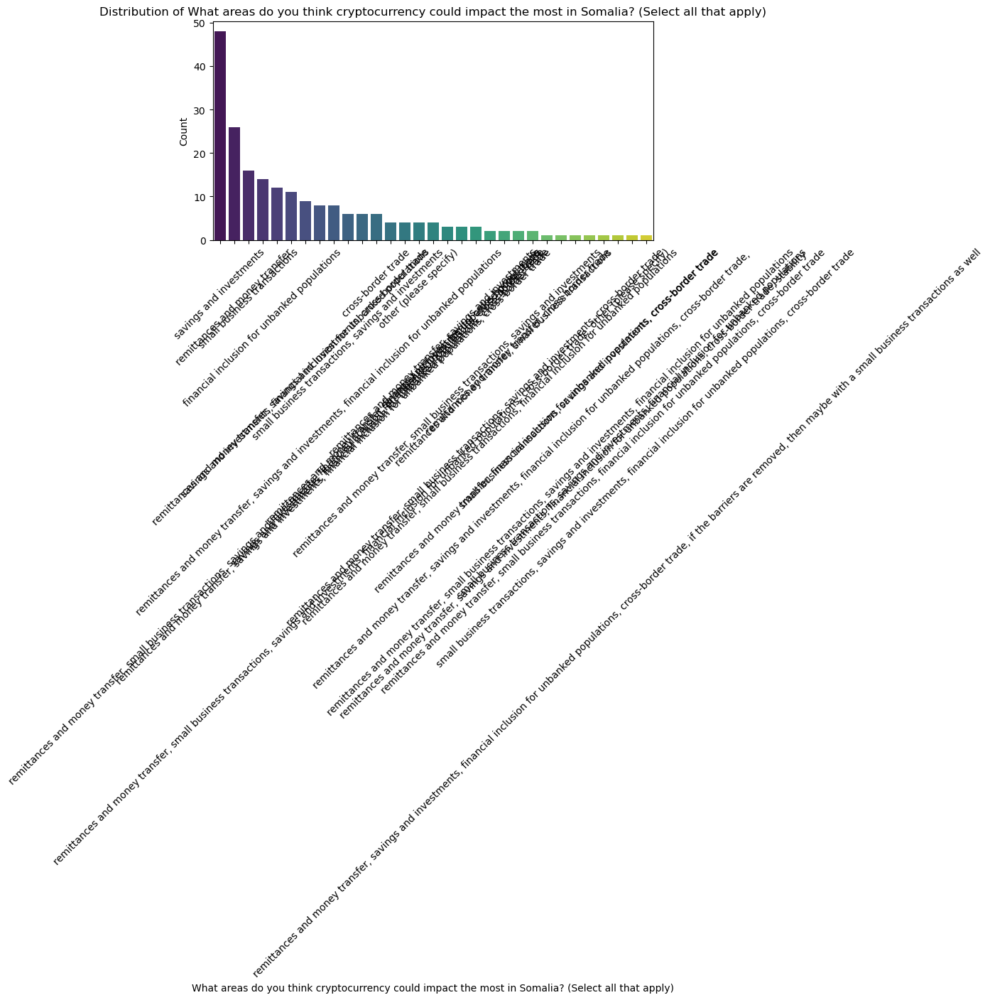

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


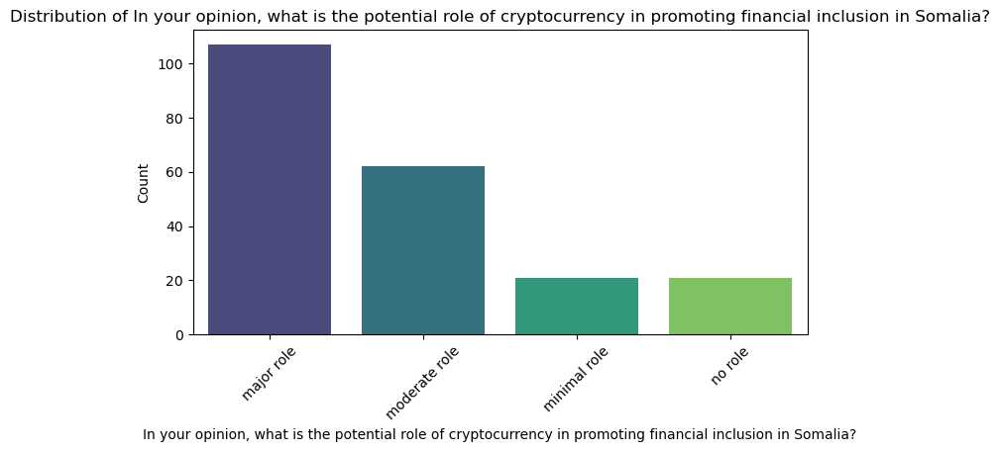

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\40349370.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)


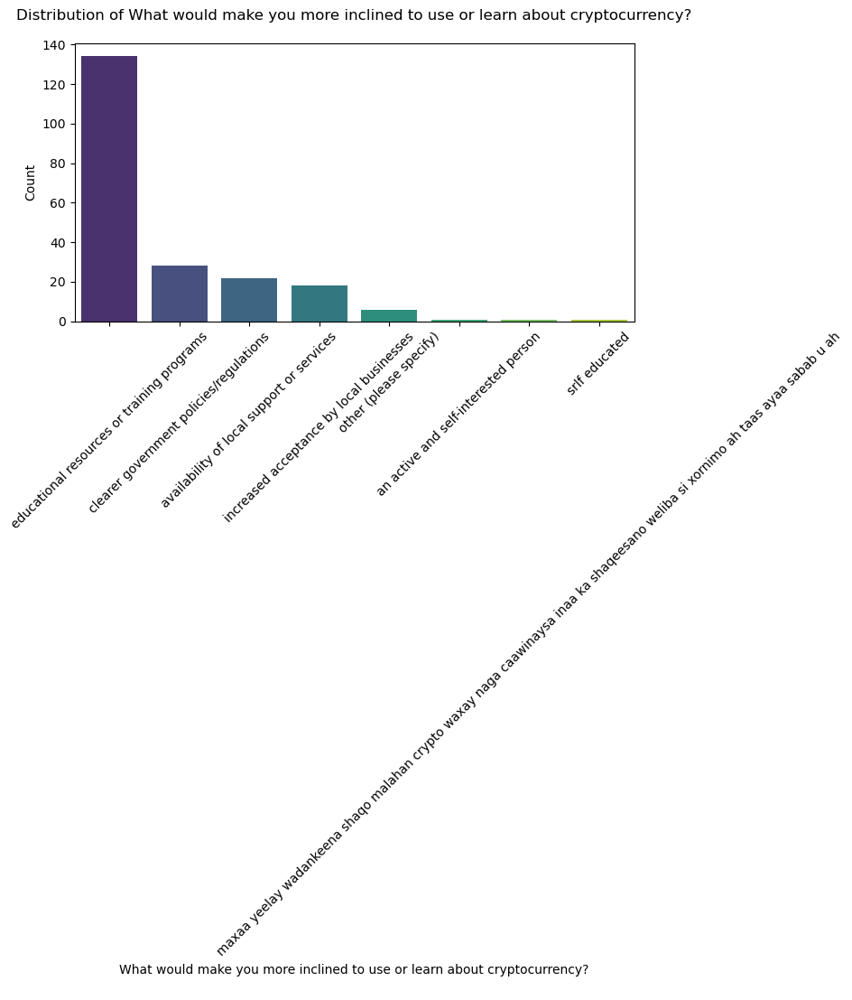

In [54]:
categorical_columns = crypto_data_cleaned.select_dtypes(include=["object", "category"]).columnsfor col in categorical_columns:    plt.figure(figsize=(8, 4))    sns.countplot(data=crypto_data_cleaned, x=col, palette="viridis", order=crypto_data_cleaned[col].value_counts().index)    plt.title(f"Distribution of {col}")    plt.xlabel(col)    plt.ylabel("Count")    plt.xticks(rotation=45)    plt.show()

In [64]:
numerical_columns = crypto_data_cleaned.select_dtypes(include=["float64", "int64"]).columnsfor col in numerical_columns:    plt.figure(figsize=(8, 4))    sns.histplot(crypto_data_cleaned[col], kde=True, color="skyblue")    plt.title(f"Distribution of {col}")    plt.show()

In [66]:
numerical_columns

Index([], dtype='object')

In [68]:
plt.figure(figsize=(12, 8))sns.heatmap(crypto_data_cleaned[numerical_columns].corr(), annot=True, cmap="coolwarm", fmt=".2f")plt.title("Correlation Matrix")plt.show()

ValueError: zero-size array to reduction operation fmin which has no identity

<Figure size 1200x800 with 0 Axes>

In [70]:
crypto_data_cleaned[numerical_columns] = crypto_data_cleaned[numerical_columns].fillna(0)

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


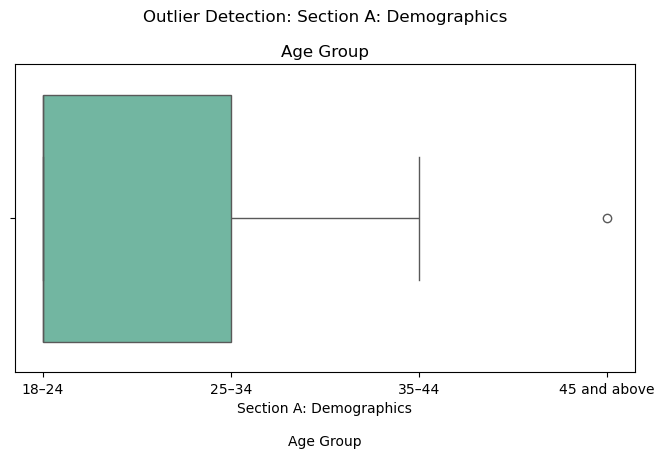

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


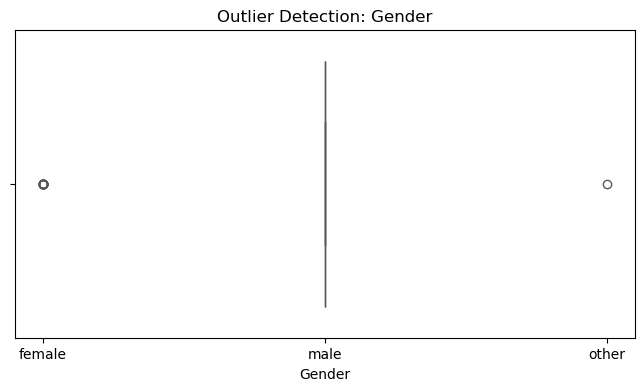

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


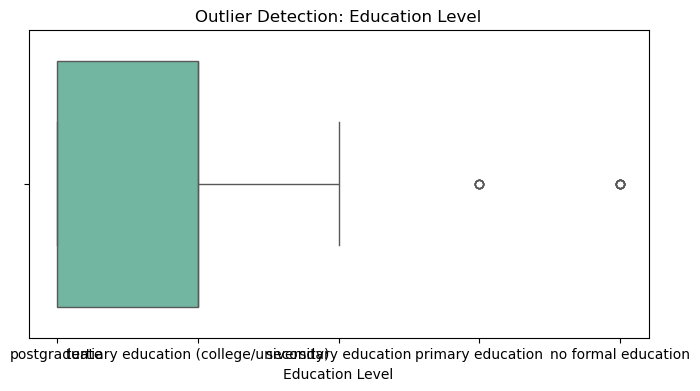

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


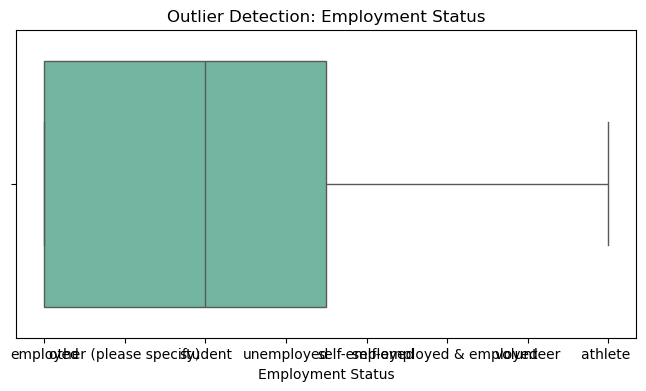

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


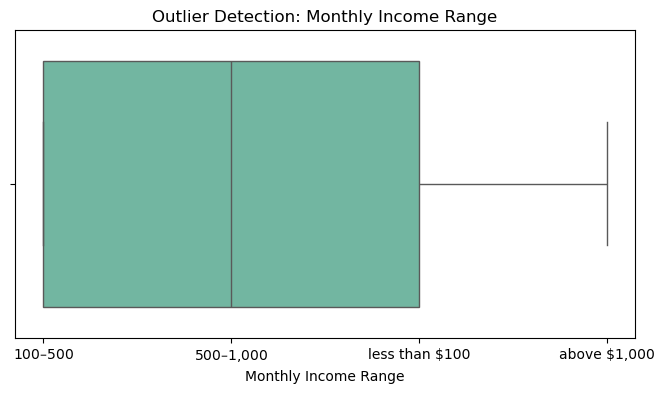

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


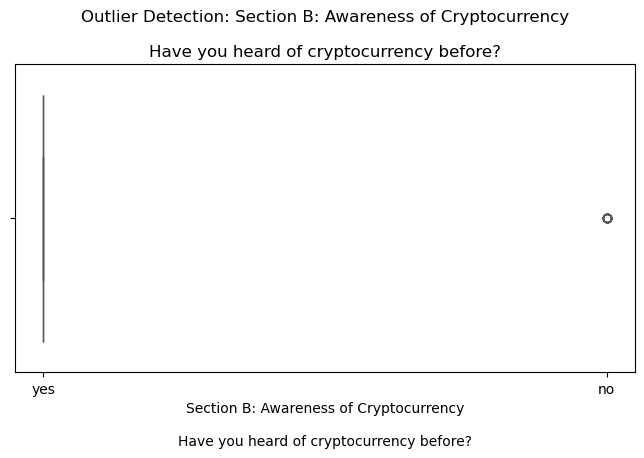

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


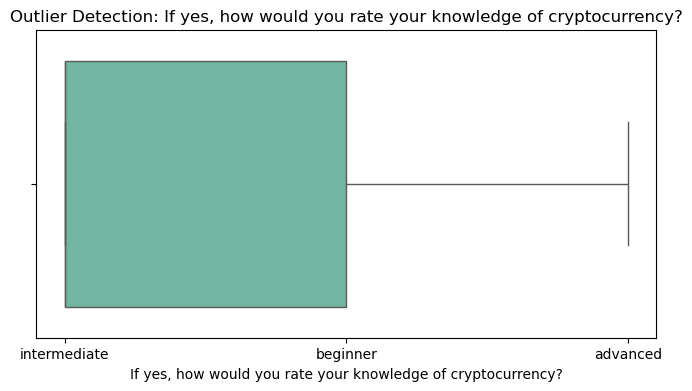

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


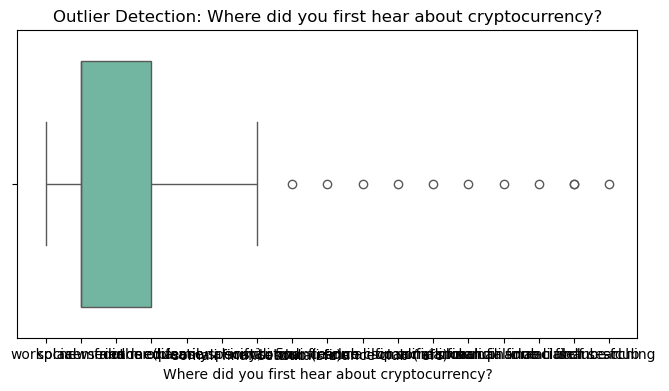

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


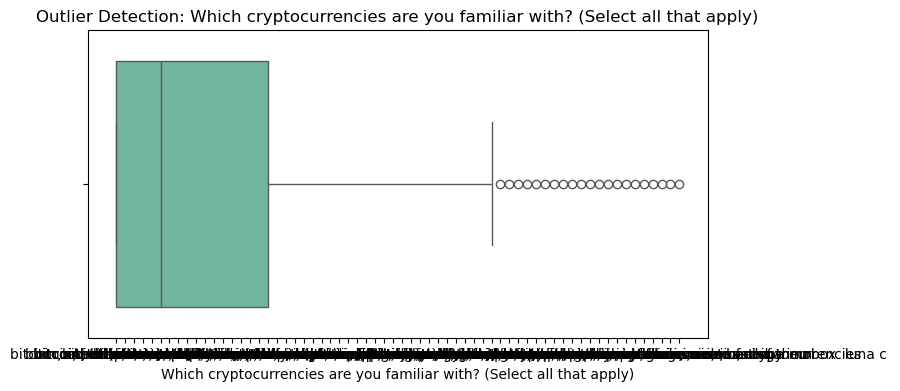

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


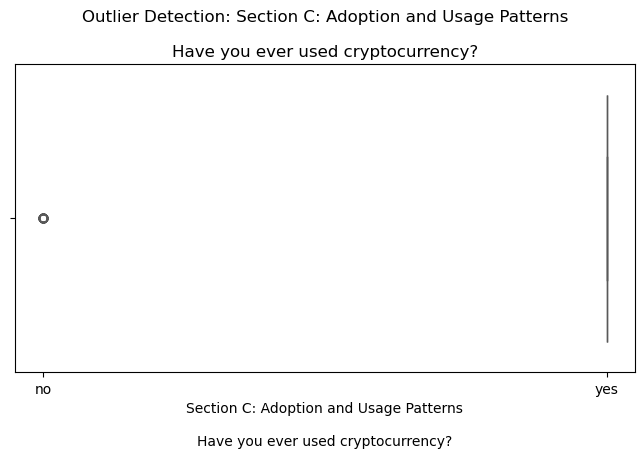

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


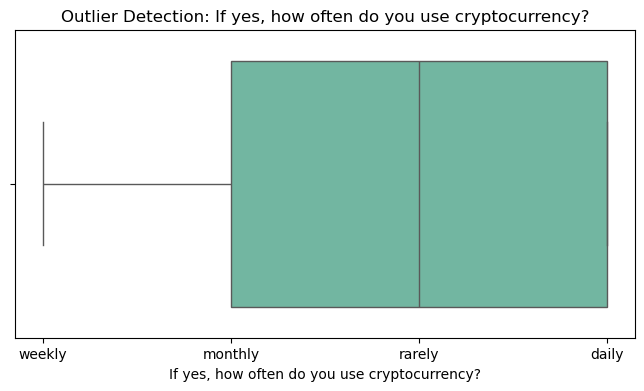

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


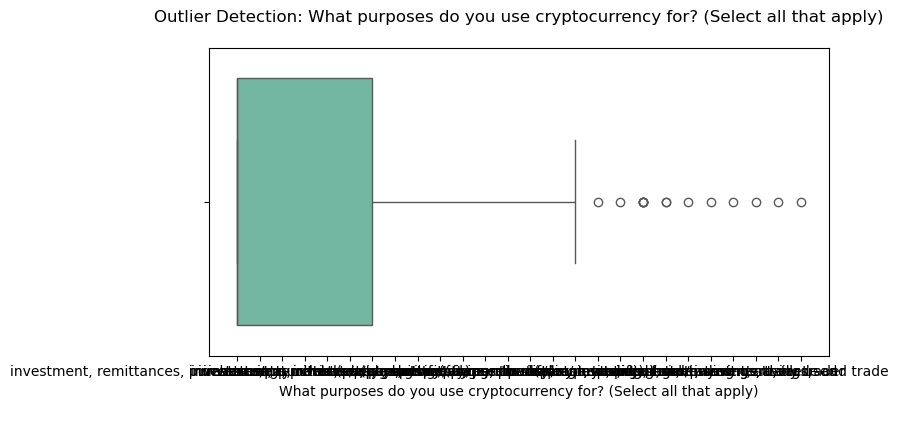

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


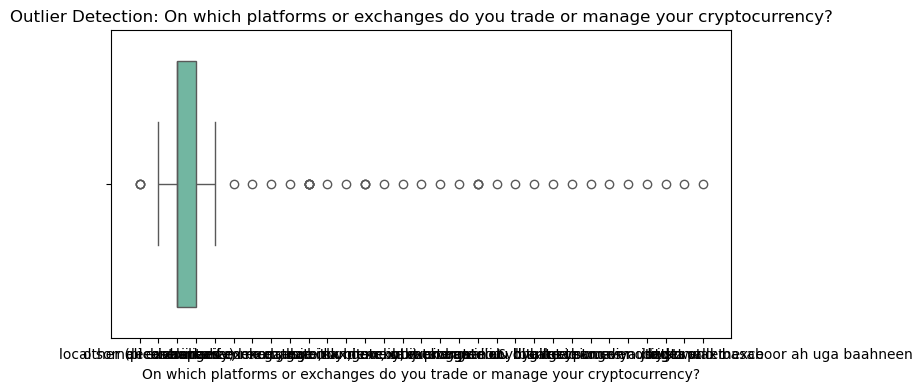

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


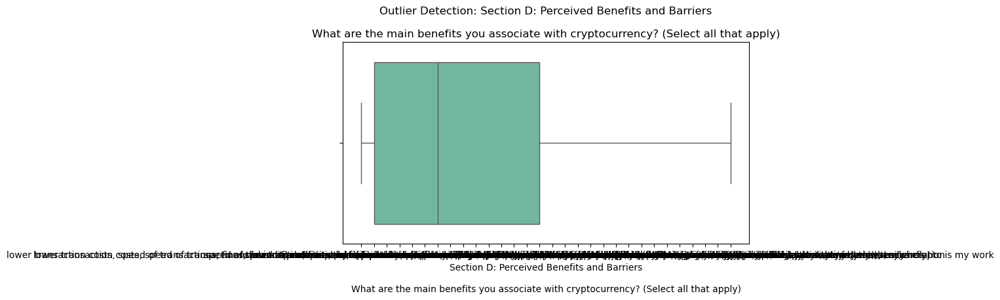

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


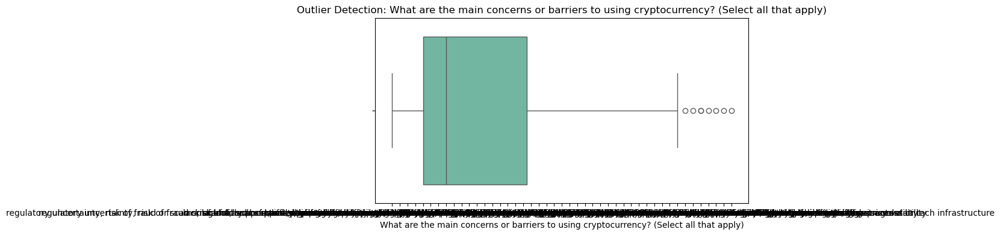

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


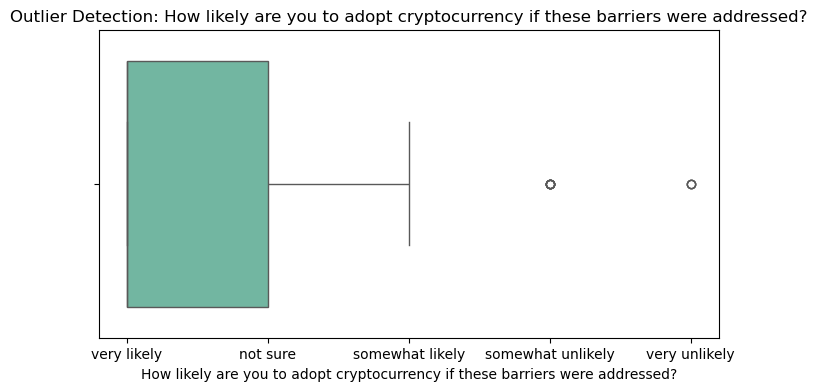

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


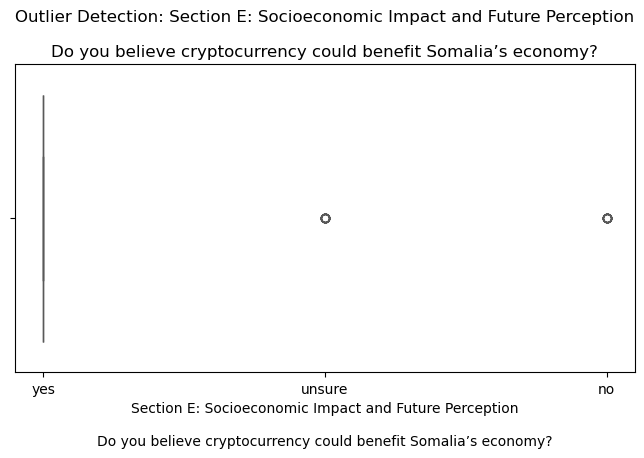

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


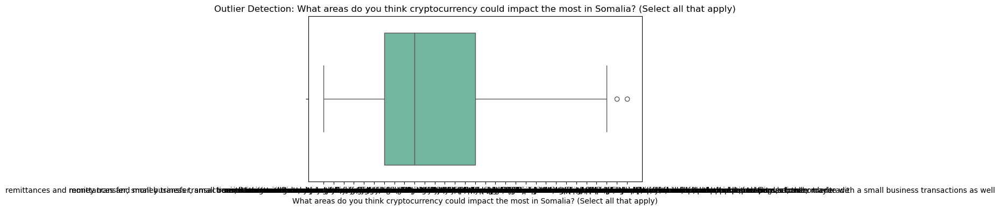

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


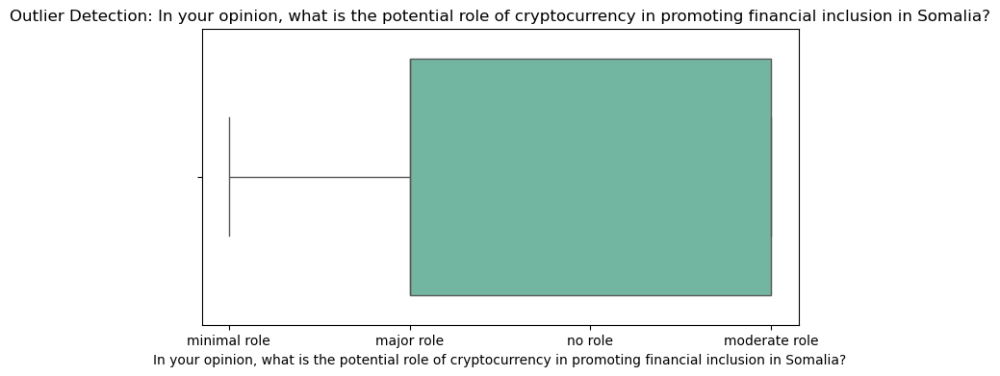

C:\Users\BOT\AppData\Local\Temp\ipykernel_5156\1791226001.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")


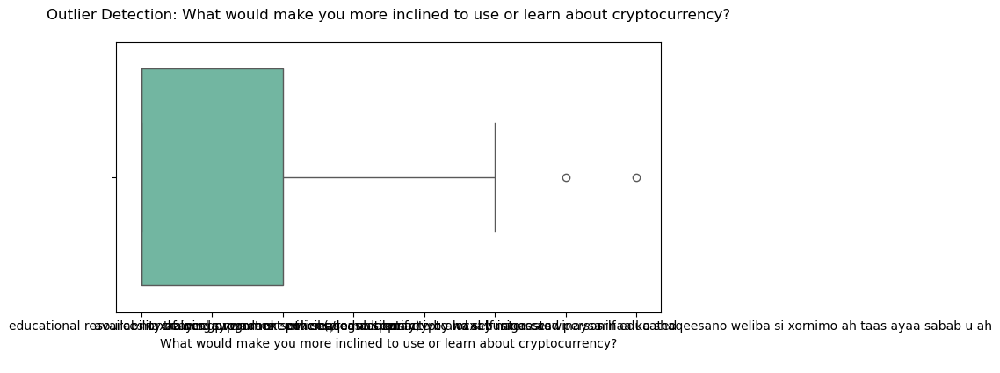

In [72]:
for col in categorical_columns:    plt.figure(figsize=(8, 4))    sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")    plt.title(f"Outlier Detection: {col}")    plt.show()

In [74]:
for col in numerical_columns:    plt.figure(figsize=(8, 4))    sns.boxplot(data=crypto_data_cleaned, x=col, palette="Set2")    plt.title(f"Outlier Detection: {col}")    plt.show()

In [84]:
for col in numerical_columns:    Q1 = crypto_data_cleaned[col].quantile(0.25)    Q3 = crypto_data_cleaned[col].quantile(0.75)    IQR = Q3 - Q1    lower_bound = Q1 - 1.5 * IQR    upper_bound = Q3 + 1.5 * IQR    crypto_data_cleaned = crypto_data_cleaned[(crypto_data_cleaned[col] >= lower_bound) & (crypto_data_cleaned[col] <= upper_bound)]print("\nOutliers have been handled using the IQR method.")


Outliers have been handled using the IQR method.


In [86]:
numerical_columns

Index([], dtype='object')

In [88]:
label_encoders = {}for col in crypto_data_cleaned.select_dtypes(include=['object']).columns:    le = LabelEncoder()    crypto_data_cleaned[col] = le.fit_transform(crypto_data_cleaned[col])    label_encoders[col] = le

In [90]:
le

LabelEncoder()

In [92]:
label_encoders

{'Section A: Demographics\n\nAge Group': LabelEncoder(),
 'Gender': LabelEncoder(),
 'Education Level': LabelEncoder(),
 'Employment Status': LabelEncoder(),
 'Monthly Income Range': LabelEncoder(),
 'Section B: Awareness of Cryptocurrency\n\nHave you heard of cryptocurrency before?': LabelEncoder(),
 'If yes, how would you rate your knowledge of cryptocurrency?': LabelEncoder(),
 'Where did you first hear about cryptocurrency?': LabelEncoder(),
 'Which cryptocurrencies are you familiar with? (Select all that apply)': LabelEncoder(),
 'Section C: Adoption and Usage Patterns\n\nHave you ever used cryptocurrency?': LabelEncoder(),
 'If yes, how often do you use cryptocurrency?': LabelEncoder(),
 'What purposes do you use cryptocurrency for? (Select all that apply)\n': LabelEncoder(),
 'On which platforms or exchanges do you trade or manage your cryptocurrency?': LabelEncoder(),
 'Section D: Perceived Benefits and Barriers\n\nWhat are the main benefits you associate with cryptocurrency? (

In [94]:
import plotly.express as px

In [98]:
Figure=px.scatter(data_frame=crypto_data_cleaned,x='Education Level',y='Employment Status',size='Employment Status',trendline='ols')

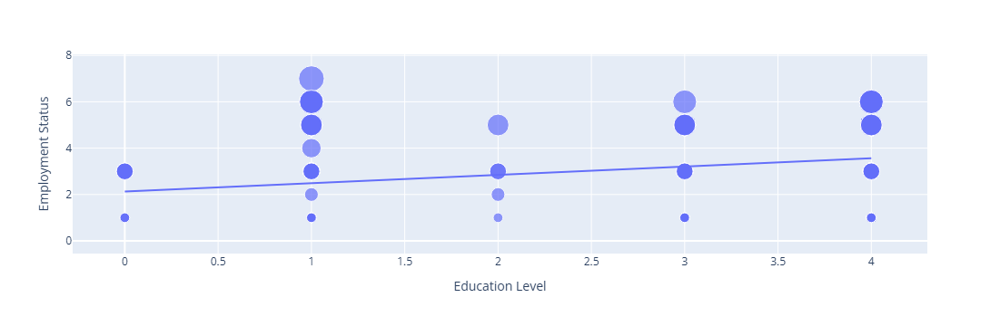

In [100]:
Figure

In [104]:
Figure1=px.scatter(data_frame=crypto_data_cleaned,x='Monthly Income Range',y='If yes, how would you rate your knowledge of cryptocurrency?',size='Monthly Income Range',trendline='ols')

#expand the comparison

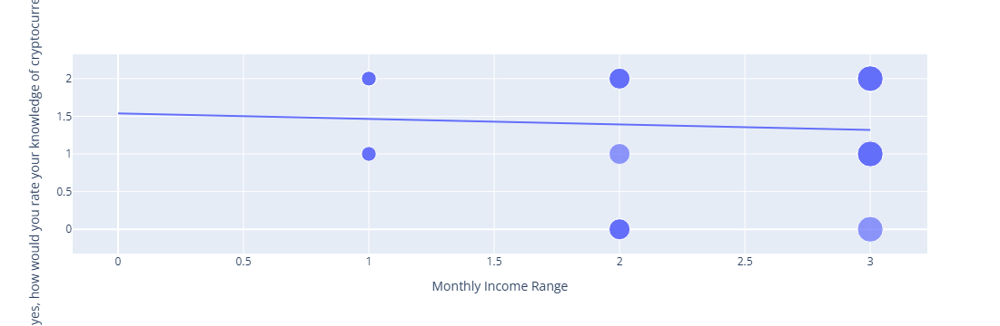

In [106]:
Figure1

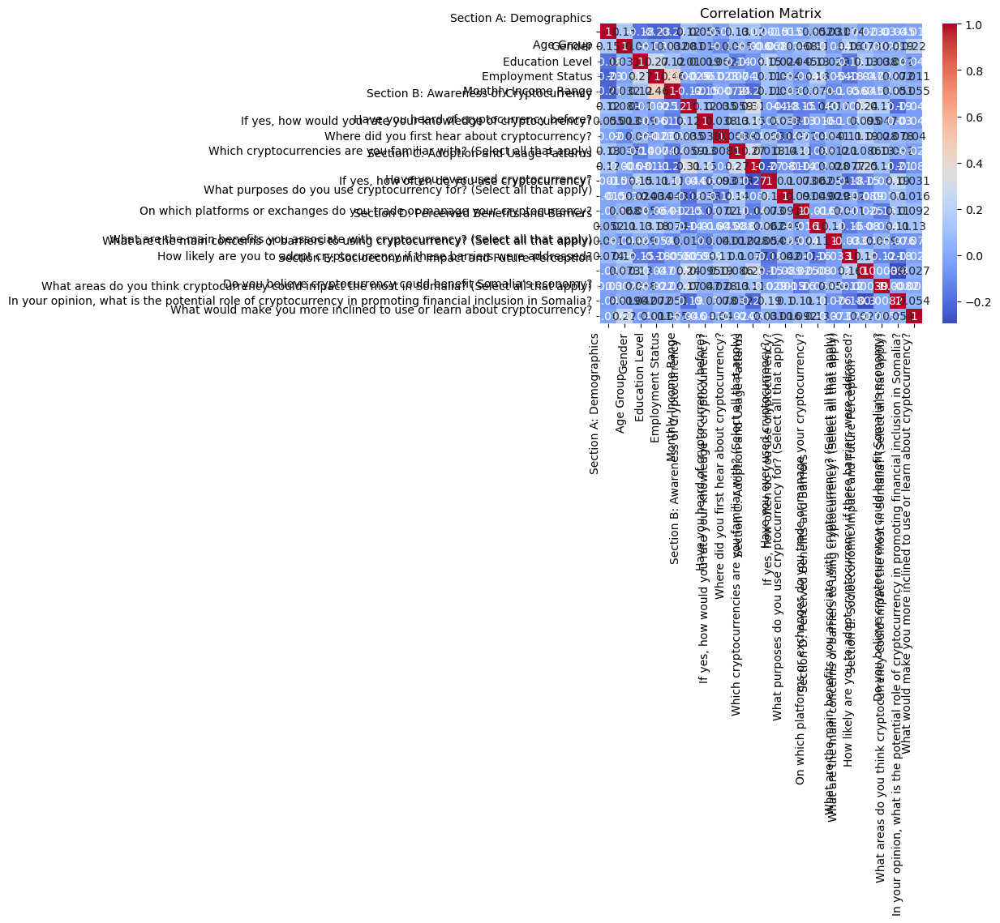

In [111]:
import seaborn as snsimport matplotlib.pyplot as pltcorrelation_matrix = .corr()sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")plt.title("Correlation Matrix")plt.show()

#ROUGH

In [123]:
correlation_matrix = crypto_data_cleaned.corr()target = 'If yes, how often do you use cryptocurrency?'correlation_with_target = correlation_matrix[target]selected_features = correlation_with_target[    (correlation_with_target > 0.4) & (correlation_with_target < 1.0)].index.tolist()print("Selected Features:", selected_features)

Selected Features: []


In [126]:
target = "Section B: Awareness of Cryptocurrency\n\nHave you heard of cryptocurrency before?"features = [col for col in crypto_data_cleaned.columns if col != target]X = crypto_data_cleaned[features]y = crypto_data_cleaned[target]

In [128]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)print("\nData has been split into training and testing sets.")


Data has been split into training and testing sets.


In [130]:
model = RandomForestClassifier(random_state=42)model.fit(X_train, y_train)print("\nModel training completed.")


Model training completed.


In [132]:
y_pred = model.predict(X_test)

In [134]:
y_pred

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [136]:
accuracy = accuracy_score(y_test, y_pred)print(f"\nModel Accuracy: {accuracy:.2f}")


Model Accuracy: 0.91


In [138]:
target = "Section C: Adoption and Usage Patterns\n\nHave you ever used cryptocurrency?"features = [col for col in crypto_data_cleaned.columns if col != target]X = crypto_data_cleaned[features]y = crypto_data_cleaned[target]

In [140]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)print("\nData has been split into training and testing sets.")


Data has been split into training and testing sets.


In [168]:
modelP = RandomForestClassifier(random_state=42)modelP.fit(X_train, y_train)print("\nModel training completed.")


Model training completed.


In [170]:
y_pred = modelP.predict(X_test)

In [172]:
accuracy = accuracy_score(y_test, y_pred)print(f"\nModel Accuracy: {accuracy:.2f}")


Model Accuracy: 0.88


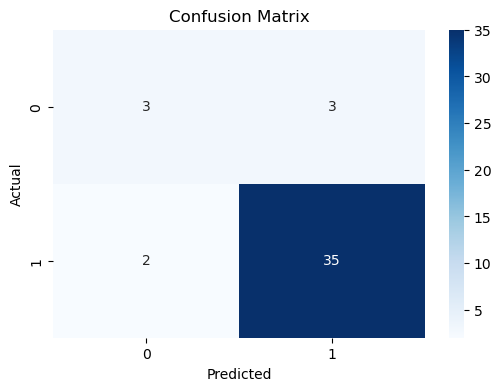

In [154]:
conf_matrix = confusion_matrix(y_test, y_pred)plt.figure(figsize=(6, 4))sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d")plt.title("Confusion Matrix")plt.xlabel("Predicted")plt.ylabel("Actual")plt.show()

In [156]:
print("\nClassification Report:")print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.50      0.55         6
           1       0.92      0.95      0.93        37

    accuracy                           0.88        43
   macro avg       0.76      0.72      0.74        43
weighted avg       0.88      0.88      0.88        43



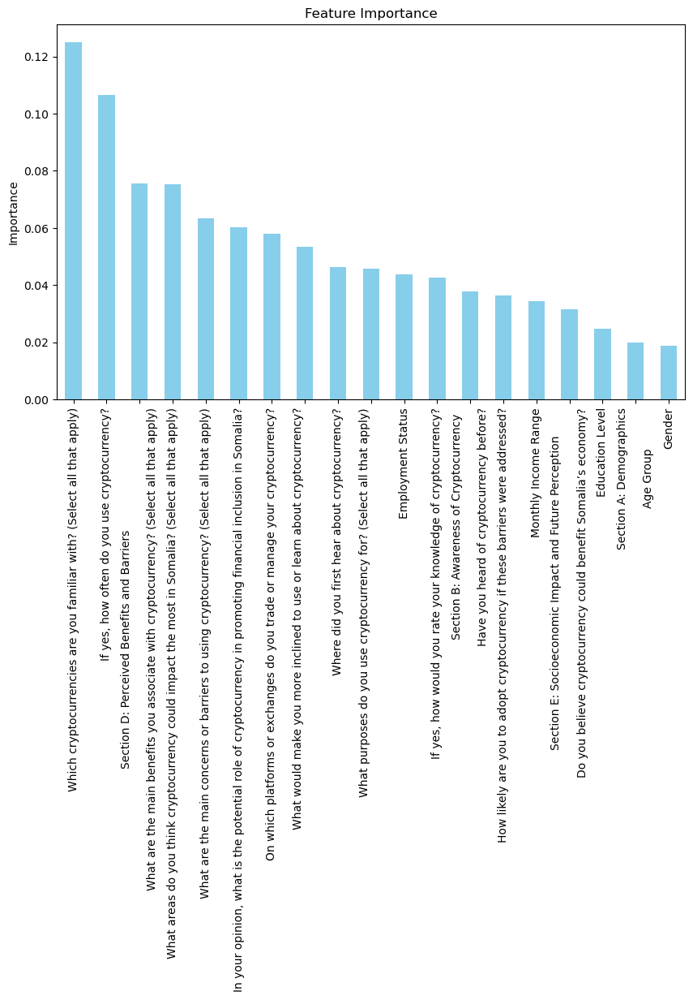

In [164]:
feature_importances = pd.Series(model.feature_importances_, index=features).sort_values(ascending=False)plt.figure(figsize=(10, 6))feature_importances.plot(kind="bar", color="skyblue")plt.title("Feature Importance")plt.ylabel("Importance")plt.show()

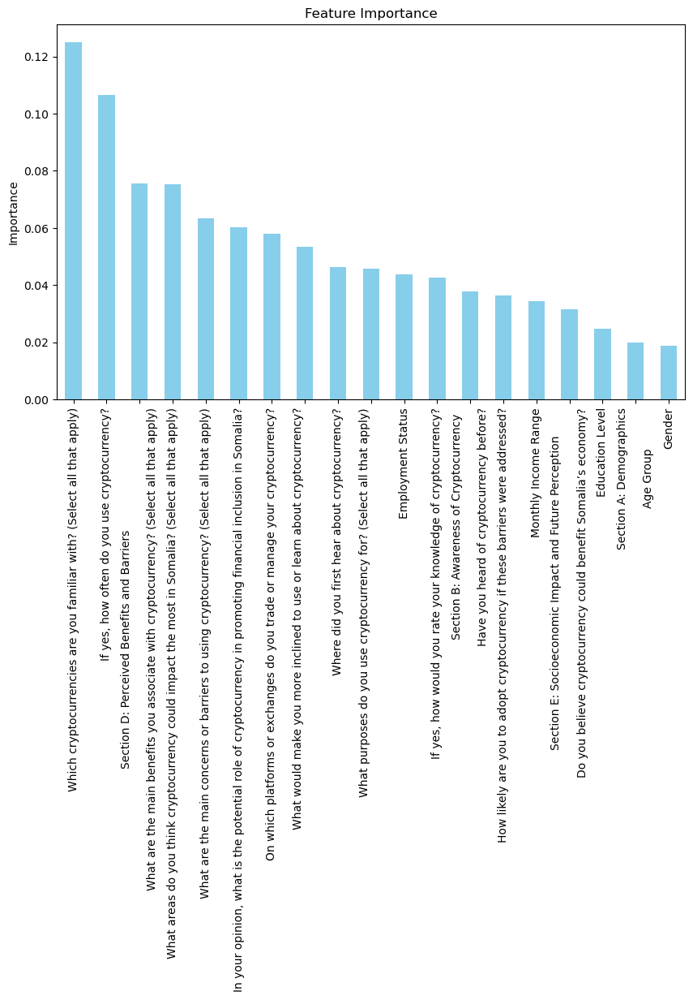

In [174]:
feature_importances = pd.Series(modelP.feature_importances_, index=features).sort_values(ascending=False)plt.figure(figsize=(10, 6))feature_importances.plot(kind="bar", color="skyblue")plt.title("Feature Importance")plt.ylabel("Importance")plt.show()